In [ ]:
from map_patching import map_patching_utils
from score_recognition import score_recognition_utils

In [ ]:
scores = score_recognition_utils.read_scores('../attachments/20211208_214922_918242881284751360.png')
scores

In [ ]:
files = ["image30.jpg", "image31.jpg"]
patchwork = map_patching_utils.patch_partial_maps(files, "example.")

In [ ]:
files = ["image41.jpg", "image40.jpg"]
patchwork = map_patching_utils.patch_partial_maps(files, "winter&&storms.")

reference_positions:

top: (1121, 274)

left: (105, 880)

In [ ]:

import cv2
import numpy as np

root_path = "/Users/jean/Documents/Coding/Polytopia/resources/"
image_path = root_path + "bot_patch.png"
template_path = root_path + "bot_patch_alpha.png"

In [ ]:
template = cv2.imread("/Users/jean/Documents/Coding/Polytopia/resources/bot_patch_alpha.png", 0)

In [ ]:
img_rgb = cv2.imread("/Users/jean/Documents/Coding/Polytopia/resources/bot_patch.png")
template = cv2.imread("/Users/jean/Documents/Coding/Polytopia/resources/bot_patch_alpha.png", 0)

In [ ]:
cv2.imwrite('/Users/jean/Documents/Coding/Polytopia/resources/detected.png',img_rgb)

In [ ]:
import cv2
from score_recognition.score_recognition_utils import *
path = "/Users/jean/Documents/Coding/Polytopia/src/resources/polytopia-helper-testing/SCORE_INPUT/9be6bc84-6b45-40a3-a3eb-062b65717336.png"
path = "/Users/jean/Documents/Coding/Polytopia/src/Screenshot_20220208-192331.jpg"
image = cv2.imread(path)
# score_image = crop(image)
read_scores(image)

In [ ]:
import os
from common import image_utils
from common.image_operation import ImageOp

os.environ['POLYTOPIA_DEBUG'] = "0"
from map_patching.map_patching_utils import patch_partial_maps

# files = ["3c3581aa-48fe-479a-9f82-8916cdcf2704", "1843f954-6e67-4aee-a493-f63f1043785c", "91dfdfdf-f7c0-4175-aab0-161b6da704b4"]
# files = ['13bd77f1-9b3b-455e-b24f-43b0b0e726e2', '1d5c103a-3ce3-42d7-b16e-308b045e75b6', '6ad460f2-4673-4ed6-901e-4c1e0bf5cf69', '91dfdfdf-f7c0-4175-aab0-161b6da704b4']
# files = ["22c03726-5e39-46aa-ad7b-fb247aa5c9d7"]
# files = ['IMG_1123', 'IMG_1124']
files = ['image_1', 'image_2', 'image_3']
# files = ['IMG_1308', 'IMG_8255']
# channel_name = 'polytopia-helper-testing'
# channel_name = "eli-jl-host-game-14"
# channel_name = "win-away-vs--reef-of-prophecy-game4"
channel_name = "testing-resources"
# channel_name = 'map-of-faith-game5'
map_size = "400"
images = [
	await image_utils.load_image(None, channel_name, None, filename_i, ImageOp.INPUT)
	for filename_i in files]
images.insert(0, image_utils.get_background_template(map_size))
files.insert(0, "background")
patch_path, filename, patching_errors = patch_partial_maps(channel_name, images, files, map_size)
print(patch_path)

In [ ]:
from map_patching.map_patching_utils import split_in_rows
from common import image_utils
from common.image_operation import ImageOp
DEBUG = 1

def prepare_turn_image(image, low_thresh):
    crop = image[:int(image.shape[0] / 4), :]
    grayImage = cv2.cvtColor(crop, cv2.COLOR_BGR2GRAY)
    (_, thresh) = cv2.threshold(grayImage, low_thresh, 255, cv2.THRESH_BINARY)
    cnts = cv2.findContours(thresh, cv2.RETR_LIST,
                    cv2.CHAIN_APPROX_SIMPLE)[-2]
    for cnt in cnts:
        if cv2.contourArea(cnt) < 15:
            cv2.fillPoly(thresh, [cnt], color=(0,0,0))
    return thresh

def get_turn(image, low_thresh=130, channel_name=None):
    selected_image = prepare_turn_image(image, low_thresh)
    cv2.imwrite('./bin.png', 255 - selected_image)
    # map_text = pytesseract.image_to_string(selected_image, config='--oem 3 --psm 6').split("\n")

    contours, _ = cv2.findContours(selected_image, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)

    rows, row_mins, row_maxes = split_in_rows(contours)

    delta = 15
    turn = None
    for i in rows.keys():
        row_min_i = max(row_mins[i] - delta, 0)
        row_max_i = min(row_maxes[i] + delta, selected_image.shape[0])
        row_image = selected_image[row_min_i:row_max_i]
        if DEBUG and channel_name is not None:
            image_utils.save_image(row_image, channel_name, "binary_%d" % i, ImageOp.TURN_PIECES)
        row_text = pytesseract.image_to_string(255 - row_image, config='--psm 6 -c load_system_dawg=0 load_freq_dawg=0 load_punc_dawg=0')
        print(row_text)
        cleared_row_text = row_text.replace("\n", "").replace("\x0c", "")
        cleared_row_text = re.sub(r"[^a-zA-Z0-9 ]", "", cleared_row_text)
        if 'Scores' not in cleared_row_text and 'Stars' not in cleared_row_text:
            cleared_row_numbers = re.sub(r"[^0-9 ]", "", cleared_row_text).replace("  ", " ").strip()
            print(i, cleared_row_numbers)
            cleared_row_text_split = cleared_row_numbers.split(" ")
            if len(cleared_row_text_split) > 2 and cleared_row_text_split[2].isnumeric():
                turn = cleared_row_text_split[2]
    if DEBUG:
        if turn is None:
            if low_thresh > 160:
                print("turn not recognised")
            else:
                return get_turn(image, low_thresh + 10)
        else:
            print("turn %s" % turn)
    return turn

In [ ]:
import re
import os
import cv2
import math
import discord
import asyncio
import pytesseract
import numpy as np
import pandas as pd

from common import image_utils
from common.image_operation import ImageOp
from common import image_processing_utils
from database_interaction import database_client
from map_patching import map_patching_utils
os.environ['POLYTOPIA_DEBUG'] = "1"
image = cv2.imread('/Users/jean/Documents/Coding/Polytopia/tests/resources/map_patching/image_8.png')
turn = get_turn(image, channel_name="general")
print(turn)

In [ ]:
from map_patching import map_patching_utils
path = '/Users/jean/Documents/Coding/Polytopia/src/IMG_6815.png'
# path = '/Users/jean/Documents/Coding/Polytopia/src/resources/eli-jl-host-game-14/MAP_INPUT/22c03726-5e39-46aa-ad7b-fb247aa5c9d7.png'
img = cv2.imread(path)
edges = map_patching_utils.get_three_color_edges(img)
cv2.imwrite('./edges.png', edges)
blur = cv2.GaussianBlur(edges, (25, 25), 6)
val, threshold = cv2.threshold(blur, 30, 255, cv2.THRESH_BINARY)
cv2.imwrite('./thresh_1.png', threshold)
distance_map = cv2.distanceTransform(255 - threshold.astype(np.uint8), cv2.DIST_C, 3).astype(np.float32)
blur_map = cv2.GaussianBlur(distance_map, (51, 51), 0.2)
val, threshold = cv2.threshold(blur_map, 60, 255, cv2.THRESH_BINARY)
cv2.imwrite('./thresh_2.png', threshold)
distance_map = cv2.distanceTransform(255 - threshold.astype(np.uint8), cv2.DIST_L2, 3).astype(np.float32)
val, threshold = cv2.threshold(distance_map, 70, 255, cv2.THRESH_BINARY)
cv2.imwrite('./thresh.png', threshold)
cv2.imwrite('./distance_map_bis.png', distance_map)
masked_thresh = threshold.astype(np.uint8)[50:-50, 50:-50]
print(type(masked_thresh), masked_thresh.dtype, masked_thresh.shape)
mask = np.zeros(img.shape[:2], dtype="uint8")
print(type(mask), mask.dtype, mask.shape)
masked = cv2.bitwise_and(img, img, mask=masked_thresh)
cv2.imwrite('./masked.png', masked)

In [ ]:
path = '/Users/jean/Documents/Coding/Polytopia/src/resources/new-channel/THREE_COLOR_EDGES/f86ac4c3-5d42-4a8c-939d-e3c947035ae3.png'
path = '/Users/jean/Documents/Coding/Polytopia/src/resources/ps11w4-winterstorms_plague-e99769/INPUT/1c3f544e-dc6c-4aff-b6cd-ac5408439269.png'
files = ['f86ac4c3-5d42-4a8c-939d-e3c947035ae3']
files = ['1c3f544e-dc6c-4aff-b6cd-ac5408439269']

channel_name = 'new-channel'
channel_name = 'ps11w4-winterstorms_plague-e99769'
from map_patching import map_patching_utils
await map_patching_utils.patch_partial_maps(channel_name, files, 400, None)

In [ ]:
import cv2
from map_patching import map_patching_utils
files = ['f86ac4c3-5d42-4a8c-939d-e3c947035ae3']
processed_map, vertices_i, is_vertical_i = await map_patching_utils.process_raw_map(
    files[0], 1, 'new-channel', map_size=400, 
    database_client=None, message=None, kernel_size=5, sigma=5)
cv2.imwrite('./processed_map.png', processed_map)

In [5]:
import cv2
path = '/Users/jean/Documents/Coding/Polytopia/src/Screenshot_20220125_143137_air.com.midjiwan.polytopia.jpg'
img = cv2.imread(path)

# img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
light = (0, 0, 0)
dark = (10, 10, 10)
mask = cv2.inRange(hsv, light, dark)
cv2.imwrite('./mask.png', mask)
result = cv2.bitwise_and(img, img, mask=mask)
cv2.imwrite('./colour.png', result)

True

In [18]:
#gray = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY)
thresh = cv2.threshold(mask, 40, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
cv2.imwrite('./thresh.png', thresh[1])

True

In [26]:
dist = cv2.distanceTransform(255 - thresh[1], cv2.DIST_L2, 3)
norm = cv2.normalize(dist, 0, 255, cv2.NORM_MINMAX)
cv2.imwrite('./norm.png', norm)
cv2.imwrite('./dist.png', dist)

True

In [31]:
mask_blur = cv2.GaussianBlur(mask, (25, 25), 1)
cv2.imwrite('./mask_blur.png', mask_blur)



True

In [35]:
factor = 1 / 8.0
new_dim = (int(mask.shape[1] * factor), int(mask.shape[0] * factor))
small = cv2.resize(mask, new_dim, interpolation=cv2.INTER_AREA)
cv2.imwrite('./small.png', small)

True

In [36]:
thresh = cv2.threshold(mask, 40, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
cv2.imwrite('./thresh.png', thresh[1])

True

In [64]:
from common import image_processing_utils

cv2.imwrite('./edges.png', edges)

True

In [125]:
import numpy as np
edges = image_processing_utils.get_one_color_edges(mask)
linesP = cv2.HoughLinesP(edges, 1, np.pi / 180, 50, None, 100, 50)
len(linesP), len(linesP[0][0])

(113, 4)

In [126]:

len(linesP)

58

In [150]:



import matplotlib.pyplot as plt

In [151]:

#preds = dbscan(blobs, 0.2, 5)[1]
#colour_list = ['red', 'green', 'blue', 'yellow', 'pink']
#colours = [colour_list[i] for i in clustering.labels_]

# if 1 line: not yet managed
# if 2 lines: check if they cross reasonably near, 1 corner
# if 3 lines: 2 should not cross soon, 

In [8]:
from common import image_processing_utils
from typing import Optional, Tuple
import numpy as np

def getSquaredLength(line):
	dx = float(line[2] - line[0])
	dy = float(line[3] - line[1])
	return dx * dx + dy * dy

def selectLines(lines, labels):
	selected_lines = []
	for i in range(max(labels) + 1):
		label_lines = [(line, getSquaredLength(line[0])) for j, line in enumerate(lines) if labels[j] == i]
		label_lines.sort(key=lambda x: -x[1])
		longest_line = label_lines[0][0]
		selected_lines.append(longest_line.tolist())
	return selected_lines

def getHeight(line):
	slope = getSlope(line)
	return float(line[1] - slope * line[0])

def norm(a):
	print("before", type(a[0]))
	return (np.array(a) - min(a)) / (max(a) - min(a))

min_slope = 0.5
max_slope = 0.9
def getSlope(line):
	dx = float(line[2] - line[0])
	dy = float(line[3] - line[1])
	return dy / dx if dx != 0 else 100

def slopeInRange(line):
	# xstart, ystart, xend, yend
	return min_slope <= abs(getSlope(line)) <= max_slope

def getIntersection(firstLine, secondLine) -> Optional[Tuple[int, int]]:
	h1 = getHeight(firstLine[0])
	h2 = getHeight(secondLine[0])
	p1 = getSlope(firstLine[0])
	p2 = getSlope(secondLine[0])
	if p1 - p2 == 0:
		return None
	x = int((h2 - h1) / (p1 - p2))
	y = int(p1 * x + h1)
	if not (-2000 <= x <= 5000) or not (-2000 <= y <= 5000):
		return None
	return x, y

def findCorners(selected_lines):
	corners = []
	for line1 in selected_lines:
		for line2 in selected_lines:
			if line1 > line2:
				if getSlope(line1[0]) != getSlope(line2[0]):
					intersection = getIntersection(line1, line2)
					if intersection is not None:
						corners.append(intersection)
	return corners
from sklearn.cluster import DBSCAN

def clusterlines(slopes, heights):
	line_functions = np.array(list(zip(slopes, heights)))
	clustering = DBSCAN(eps=0.3, min_samples=1).fit(line_functions)
	return clustering.labels_

# path = '/Users/jean/Documents/Coding/Polytopia/src/Screenshot_20220125_143137_air.com.midjiwan.polytopia.jpg'
path = '/Users/jean/Documents/Coding/Polytopia/src/templates/background_template_400.png'
img = cv2.imread(path)
light = (0, 0, 0)
dark = (10, 10, 10)
mask = cv2.inRange(img, light, dark)
edges = image_processing_utils.get_one_color_edges(mask)
linesP = cv2.HoughLinesP(edges, 1, np.pi / 180, 50, None, 100, 50)
linesP = [l for l in linesP if slopeInRange(l[0])]
slopes = norm([getSlope(line[0]) for line in linesP])
heights = norm([getHeight(line[0]) for line in linesP])
labels = clusterlines(slopes, heights)
selected_lines = selectLines(linesP, labels)
corners = findCorners(selected_lines)
corners

before <class 'float'>
before <class 'float'>


[(1044, 35), (2097, 668), (1045, 1300), (-8, 667)]

In [1]:
from map_patching.map_patching_analysis import analyse_map
import cv2
path = '/Users/jean/Documents/Coding/Polytopia/src/Screenshot_20220125_143137_air.com.midjiwan.polytopia.jpg'
img = cv2.imread(path)
output, image_params = analyse_map(img, None, "testing", "test")
output

<class 'numpy.ndarray'> (1080, 2312, 3)
ERROR SHAPE (1080, 2312) (1080, 2312)
top-bottom borders
result set 3.8947368421052633 113 29.013513513513512 0.1272507368960656
image scale 3.8947368421052633
all lines 183
filtered lines 166
('test', 3.8947368421052633, [(120, 3039, 2), (3910, 669, 0), (7710, 3043, 3), (3920, 5320, 1)])


'/Users/jean/Documents/Coding/Polytopia/src/resources/testing/MAP_PROCESSED_IMAGE/test.png'

In [2]:
from map_patching.map_patching_analysis import analyse_map
import cv2
# path_list = ['/Users/jean/Documents/Coding/Polytopia/src/Screenshot_20220125_143137_air.com.midjiwan.polytopia.jpg']
path_list = ['/Users/jean/Documents/Coding/Polytopia/src/resources/map-patching/MAP_PATCHING_OUTPUT/a80fe90b-b54f-4a26-af43-f1cd9495f561.png']
image_params = []
image_filenames = []
for path in path_list:
	img = cv2.imread(path)
	output, param = analyse_map(img, None, "map-patching", "a80fe90b-b54f-4a26-af43-f1cd9495f561")
	image_params.append(param)
	image_filenames.append("a80fe90b-b54f-4a26-af43-f1cd9495f561")

IndexError: index 3 is out of bounds for axis 2 with size 3

In [2]:
from map_patching.map_patching_analysis import analyse_background
output, param = analyse_background(None, "400")
param

<class 'numpy.ndarray'> (1328, 2094, 3)
ERROR SHAPE (1328, 2094) (1328, 2094)
top-bottom borders
result set 3.6393442622950816 108 29.675675675675677 0.44291636459879635
background scale 3.6393442622950816
all lines 157
filtered lines 157
('processed_background_template_400', 3.6393442622950816, [(7629, 2432, 3), (3798, 4734, 1), (3789, 125, 0), (-40, 2426, 2)])


('processed_background_template_400', 3.6393442622950816, [(7629, 2432, 3), (3798, 4734, 1), (3789, 125, 0), (-40, 2426, 2)])

In [3]:
from map_patching.map_patching_analysis import *
# image = cv2.imread('/Users/jean/Documents/Coding/Polytopia/src/resources/map-patching/MAP_PATCHING_OUTPUT/a80fe90b-b54f-4a26-af43-f1cd9495f561.png')
# image = cv2.imread("/Users/jean/Documents/Coding/Polytopia/src/templates/processed_background_template_400.png", cv2.IMREAD_COLOR)
image = image_utils.get_background_template("400")
#image = cv2.imread('/Users/jean/Documents/Coding/Polytopia/src/Screenshot_20220125_143137_air.com.midjiwan.polytopia.jpg')
image = cv2.imread('/Users/jean/Documents/Coding/Polytopia/src/templates/background_template_400.png')

# hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)

LIGHT_COLOUR = (0, 0, 0)
DARK_COLOUR = (10, 10, 10)

mask = cv2.inRange(image, LIGHT_COLOUR, DARK_COLOUR)
edges = image_processing_utils.get_one_color_edges(mask)

linesP = cv2.HoughLinesP(edges, 1, np.pi / 180, 50, None, 100, 50)
print("all lines %d" % len(linesP))
linesP = [line for line in linesP if slope_in_range(line[0], 0.5, 0.9)]
print("filtered lines %d" % len(linesP))

slopes = norm([get_line_slope(line[0]) for line in linesP])
heights = norm([get_line_h0(line[0]) for line in linesP])

labels = cluster_lines(slopes, heights)

selected_lines = select_lines_by_length(linesP, labels)

intersections = find_all_intersections(selected_lines)
intersections

all lines 27
filtered lines 27


[(1044, 35, 0), (2097, 668, 3), (1045, 1300, 1), (-8, 667, 2)]

In [11]:
path = '/Users/jean/Documents/Coding/Polytopia/src/templates/background_template_400.png'
img = cv2.imread(path)
light = (0, 0, 0)
dark = (10, 10, 10)
mask = cv2.inRange(img, light, dark)
edges = image_processing_utils.get_one_color_edges(mask)
linesP = cv2.HoughLinesP(edges, 1, np.pi / 180, 50, None, 100, 50)
linesP = [l for l in linesP if slopeInRange(l[0])]
slopes = norm([getSlope(line[0]) for line in linesP])
heights = norm([getHeight(line[0]) for line in linesP])
labels = clusterlines(slopes, heights)
selected_lines = selectLines(linesP, labels)
corners = findCorners(selected_lines)

In [6]:
image.dtype

dtype('uint8')

In [28]:
np.min(hsv), np.max(hsv)

(0, 255)

In [3]:
cv2.imwrite("./background_image.png", image)
cv2.imwrite("./background_nsv.png", hsv)
cv2.imwrite("./background_edges.png", edges)
cv2.imwrite("./background_mask.png", mask)

True

In [6]:
# Draw the lines
for i in range(0, len(linesP)):
	l = linesP[i][0]
	cv2.line(image, (l[0], l[1]), (l[2], l[3]), (0,0,255), 3, cv2.LINE_AA)
cv2.imwrite("./background_liens.png", image)

True

In [11]:
image.shape

(1328, 2094, 3)

In [9]:
image.shape

(1229, 1938, 3)

In [4]:
heights

array([0.8431666 , 0.70876615, 0.92308613, 0.73718517, 0.95507113,
       0.67566341, 1.        , 0.        , 0.79398222, 0.77971853])

In [5]:
slopes

array([0.94410682, 0.92616429, 0.9438939 , 0.92551694, 1.        ,
       0.92617042, 0.9440017 , 0.        , 0.92549682, 0.92568432])

In [5]:
import cv2

from map_patching.map_patching_analysis import analyse_background
from map_patching.map_patching_analysis import analyse_map
from map_patching.map_patching_patching import load_processed_background
from map_patching.map_patching_patching import load_processed_images
from map_patching.map_patching_patching import patch_processed_image_files

from common import image_utils
from common.image_operation import ImageOp

output, background_params = analyse_background(None, "400")

image_params = []
image_filenames = []
# processed_files = [(channel_name, "5c2446b1-5d51-431f-b6bc-ff1b31fe938f")]
# channel_name = "map-patching"
channel_name = "general"
processed_files = [
	#(channel_name, "5c2446b1-5d51-431f-b6bc-ff1b31fe938f")
	(channel_name, "b8b3a5b6-195c-4780-af4c-a44f9de59ad6"),
	(channel_name, "4c01f257-5a2a-4b62-ba86-d15a3b26cec6")
]
for channel_name, filename in processed_files:
	image_i = image_utils.load_image(channel_name, filename, ImageOp.INPUT)
	_, map_params = analyse_map(image_i, None, channel_name, filename)
	image_params.append(map_params)
	image_filenames.append(filename)

print("background_params = ImageParam%s" % str(background_params))
print("image_filenames = %s" % str(image_filenames))
print("image_params = [ImageParam%s]" % ", ImageParam".join([str(ip) for ip in image_params]))

selected_scaling [3.65, 110, 30.136986301369863, 388, 0.4297598704272678]
background scale 3.65
all lines 136
filtered lines 136
('processed_background_template_400', 3.65, [(7650, 2439, 3), (3814, 4744, 1), (3812, 132, 0), (-25, 2437, 2)])
Image valid 2340
selected_scaling [3.0, 129, 43.0, 128, 0.22367996201329535]
image scale 3.0
all lines 57
filtered lines 52
('b8b3a5b6-195c-4780-af4c-a44f9de59ad6', 3.0, [(-298, 3988, 2)])
Image valid 1920
selected_scaling [3.65, 110, 30.136986301369863, 180, 0.24758680555555557]
image scale 3.65
all lines 44
filtered lines 41
('4c01f257-5a2a-4b62-ba86-d15a3b26cec6', 3.65, [(745, 5749, 1), (4287, 3620, 3), (731, 1483, 0)])
background_params = ImageParam('processed_background_template_400', 3.65, [(7650, 2439, 3), (3814, 4744, 1), (3812, 132, 0), (-25, 2437, 2)])
image_filenames = ['b8b3a5b6-195c-4780-af4c-a44f9de59ad6', '4c01f257-5a2a-4b62-ba86-d15a3b26cec6']
image_params = [ImageParam('b8b3a5b6-195c-4780-af4c-a44f9de59ad6', 3.0, [(-298, 3988, 2)]),

In [1]:
from map_patching.image_param import ImageParam
channel_name = "map-patching"
background_params = ImageParam('processed_background_template_400', 3.65, [(7650, 2439, 3), (3814, 4744, 1), (3812, 132, 0), (-25, 2437, 2)])
image_filenames = ['5c2446b1-5d51-431f-b6bc-ff1b31fe938f']
image_params = [ImageParam('5c2446b1-5d51-431f-b6bc-ff1b31fe938f', 3.65, [(4307, 3390, 3)])]

In [2]:
import cv2
from map_patching.map_patching_patching import load_processed_background
from map_patching.map_patching_patching import load_processed_images
from map_patching.map_patching_patching import patch_processed_image_files

background_image = load_processed_background("400")
images = load_processed_images(image_filenames, channel_name)

patch_image = patch_processed_image_files(background_image, images, background_params, image_params)
cv2.imwrite('./patch_image.png', patch_image)

Image valid 7008
background shape (y, x) 4612 7675
third way
Selected Corner CornerOrientation.RIGHT
patch work (4847, 7643, 3)
cropped_image_i shape (6057, 4380, 4)
oppacity (6057, 4380)
bit (6057, 4380, 3)
padding (3343, 0)
<class 'numpy.ndarray'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>
(4847, 7643, 3) (3343, 0) (6057, 4380) (6057, 4380) (6057, 4380, 3)
shape for background (4847, 7643, 3)
3343 7723 4380
0 6057 6057
backgound shape (4847, 4300, 3)
shape for cropped bit (6057, 4380, 3)
4300 6057 9400 4300
4380 4380 4380 4847
cropped bit shape (4847, 4300, 3)
shape for cropped oppacity (6057, 4380)
4300 6057 9400 4300
4380 4380 4380 4847
cropped oppacity shape (4847, 4300)
should match (4847, 4300, 3) (4847, 4300, 3)


True

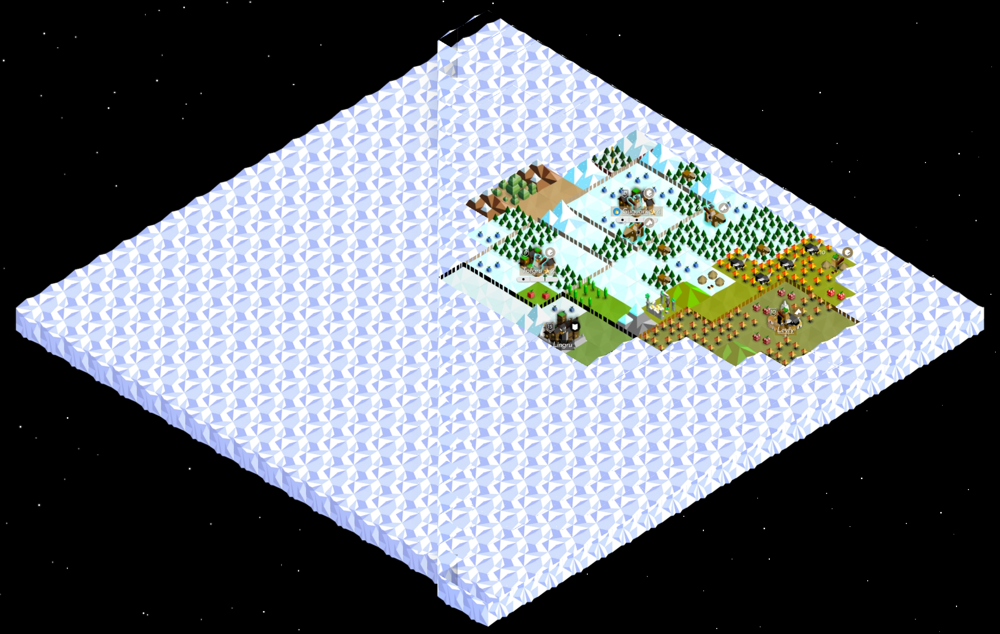

In [3]:
from PIL import Image
from IPython.display import display, clear_output

# convert color from CV2 BGR back to RGB
image = cv2.cvtColor(patch_image, cv2.COLOR_BGR2RGB)
display(Image.fromarray(image))

In [4]:
from map_patching.image_param import ImageParam
channel_name = "general"
background_params = ImageParam('processed_background_template_400', 3.65, [(7650, 2439, 3), (3814, 4744, 1), (3812, 132, 0), (-25, 2437, 2)])
image_filenames = ['b8b3a5b6-195c-4780-af4c-a44f9de59ad6', '4c01f257-5a2a-4b62-ba86-d15a3b26cec6']
image_params = [
	ImageParam('b8b3a5b6-195c-4780-af4c-a44f9de59ad6', 3.0, [(-298, 3988, 2)]),
	ImageParam('4c01f257-5a2a-4b62-ba86-d15a3b26cec6', 3.65, [(745, 5749, 1), (4287, 3620, 3), (731, 1483, 0)])]

In [5]:
import cv2
from map_patching.map_patching_patching import load_processed_background
from map_patching.map_patching_patching import load_processed_images
from map_patching.map_patching_patching import patch_processed_image_files

background_image = load_processed_background("400")
images = load_processed_images(image_filenames, channel_name)

patch_image = patch_processed_image_files(background_image, images, background_params, image_params)
cv2.imwrite('./patch_image.png', patch_image)

Image valid 7020
Image valid 7008
background shape (y, x) 4612 7675
third way
Selected Corner CornerOrientation.LEFT
patch work (4847, 7643, 3)
cropped_image_i shape (5469, 3240, 4)
oppacity (5469, 3240)
bit (5469, 3240, 3)
padding (273, 0)
<class 'numpy.ndarray'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>
(4847, 7643, 3) (273, 0) (5469, 3240) (5469, 3240) (5469, 3240, 3)
shape for background (4847, 7643, 3)
273 3513 3240
0 5469 5469
backgound shape (4847, 3240, 3)
shape for cropped bit (5469, 3240, 3)
3240 5469 5742 3240
3240 3240 3240 4847
cropped bit shape (4847, 3240, 3)
shape for cropped oppacity (5469, 3240)
3240 5469 5742 3240
3240 3240 3240 4847
cropped oppacity shape (4847, 3240)
should match (4847, 3240, 3) (4847, 3240, 3)
third way
Selected Corner CornerOrientation.TOP
patch work (4847, 7643, 3)
cropped_image_i shape (5657, 4380, 4)
oppacity (5657, 4380)
bit (5657, 4380, 3)
padding (3081, 0)
<class 'numpy.ndarray'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>
(4847, 

True

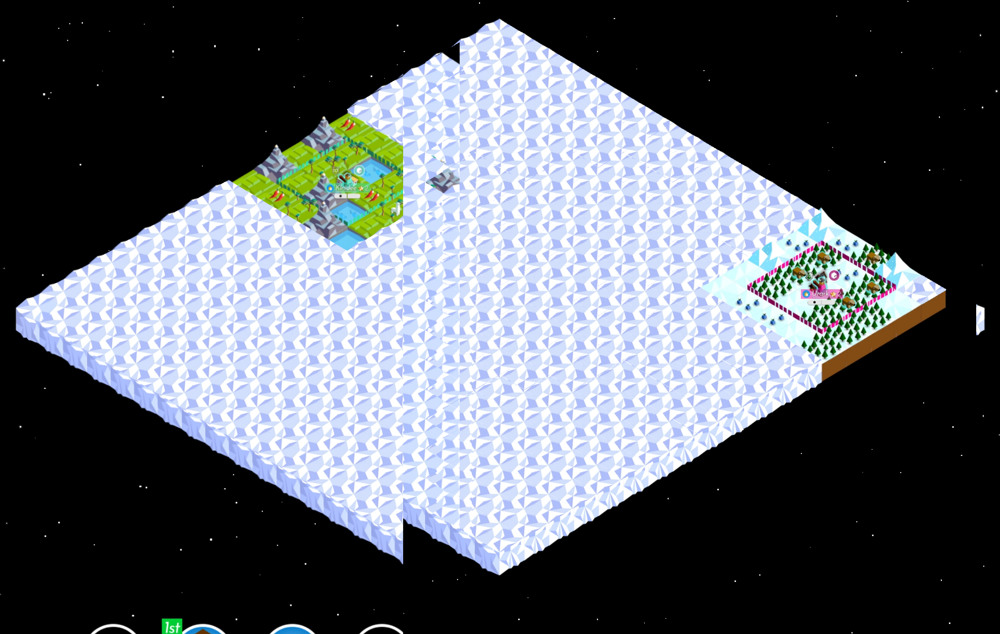

In [6]:
from PIL import Image
from IPython.display import display, clear_output

# convert color from CV2 BGR back to RGB
image = cv2.cvtColor(patch_image, cv2.COLOR_BGR2RGB)
display(Image.fromarray(image))

In [ ]:
LIGHT_COLOUR = (0, 0, 0)
DARK_COLOUR = (10, 10, 10)

image = cv2.imread("/Users/jean/Documents/Coding/Polytopia/src/Screenshot_20220125_143137_air.com.midjiwan.polytopia.jpg")
mask = cv2.inRange(image[:, :, 0:3], LIGHT_COLOUR, DARK_COLOUR)

contours, _ = cv2.findContours(255 - mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
selected_contour = sorted([(c, cv2.contourArea(c)) for c in contours], key=lambda x: -x[1])[0]
contour_mask = cv2.drawContours(np.zeros_like(mask), [selected_contour[0]], 0, (255, 255, 255))
cv2.imwrite("./contour_mask.png", contour_mask)

True

all lines 22
filtered lines 22
{0, 1, 2, 3}
selected lines 4


[(7343, 2339, 3), (3655, 4554, 1), (3665, 128, 0), (-92, 2301, 2)]

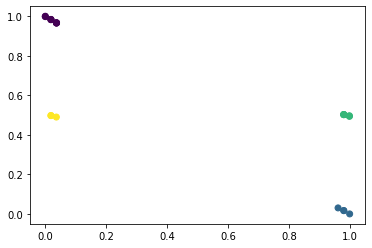

In [1]:
import os
import cv2
import math

import numpy as np

from typing import List
from typing import Tuple
from typing import Optional
from sklearn.cluster import DBSCAN

from common import image_utils
from common import image_processing_utils
from common.image_operation import ImageOp
from map_patching.image_param import ImageParam
from map_patching.corner_orientation import CornerOrientation
from database_interaction.database_client import DatabaseClient
from map_patching.map_patching_analysis import *
import matplotlib.pyplot as plt

DEBUG = int(os.getenv("POLYTOPIA_DEBUG", 0))

def get_corners(
    image: np.ndarray,
    channel_name: str,
    filename: str
) -> List[Tuple[int, int, CornerOrientation]]:

    # hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)

    LIGHT_COLOUR = (0, 0, 0)
    DARK_COLOUR = (10, 10, 10)

    mask = cv2.inRange(image[:, :, 0: 3], LIGHT_COLOUR, DARK_COLOUR)
    edges = image_processing_utils.get_one_color_edges(mask)

    blur_edges = cv2.GaussianBlur(edges, (11, 11), 3)

    _, threshold_edges = cv2.threshold(blur_edges, 3, np.max(blur_edges), cv2.THRESH_BINARY)

    # linesP = cv2.HoughLinesP(edges, 1, np.pi / 180, 50, None, 200, 50)
    linesP = cv2.HoughLinesP(threshold_edges, 10, np.pi / 180, 40, None, int(max(image.shape[0], image.shape[0]) / 10), 30)
    print("all lines %d" % len(linesP))

    if DEBUG:
        lines_image = image.copy()
        for i in range(0, len(linesP)):
            line_i = linesP[i][0]
            cv2.line(lines_image, (line_i[0], line_i[1]), (line_i[2], line_i[3]), (0, 0, 255, 255), 3, cv2.LINE_AA)
        image_utils.save_image(lines_image, channel_name, filename + "_all_lines", ImageOp.MAP_PROCESSED_IMAGE)

    linesP = [line for line in linesP if slope_in_range(line[0], 0.5, 0.9)]
    print("filtered lines %d" % len(linesP))

    if DEBUG:
        lines_image = image.copy()
        for i in range(0, len(linesP)):
            line_i = linesP[i][0]
            cv2.line(lines_image, (line_i[0], line_i[1]), (line_i[2], line_i[3]), (0, 0, 255, 255), 3, cv2.LINE_AA)
        image_utils.save_image(lines_image, channel_name, filename + "_filtered_lines", ImageOp.MAP_PROCESSED_IMAGE)

    slopes = norm([get_line_slope(line[0]) for line in linesP])
    heights = norm([get_line_h0(line[0]) for line in linesP])
    labels = cluster_lines(slopes, heights)
    print(set(labels))
    
    plt.scatter(slopes, heights, c=labels)

    selected_lines = select_lines_by_length(linesP, labels)

    print("selected lines %d" % len(selected_lines))

    if DEBUG:
        lines_image = image.copy()
        for i in range(0, len(selected_lines)):
            line_i = selected_lines[i][0]
            cv2.line(lines_image, (line_i[0], line_i[1]), (line_i[2], line_i[3]), (0, 0, 255, 255), 3, cv2.LINE_AA)
        image_utils.save_image(lines_image, channel_name, filename + "_selected_lines", ImageOp.MAP_PROCESSED_IMAGE)

    return find_all_intersections(selected_lines)

map_size = "400"
background_template = image_utils.get_background_template(map_size)
scaled_image = scale_image(background_template, 3.5)
corners = get_corners(scaled_image, "templates", "processed_background_template_%s" % map_size)
corners

In [2]:
background_params

(3.5, [(3660, 4554, 1)], 'processed_background_template_400')

In [1]:
from map_patching.map_patching_analysis import analyse_background
output, background_params = analyse_background(None, "400")
background_params

<class 'numpy.ndarray'> (1328, 2094, 3)
top-bottom borders
result set 3.6393442622950816 108 29.675675675675677 0.44291636459879635
background scale 3.6393442622950816
all lines 157
filtered lines 157
('processed_background_template_400', 3.6393442622950816, [(7629, 2432, 3), (3798, 4734, 1), (3789, 125, 0), (-40, 2426, 2)])


('processed_background_template_400', 3.6393442622950816, [(7629, 2432, 3), (3798, 4734, 1), (3789, 125, 0), (-40, 2426, 2)])

In [2]:
from map_patching.map_patching_analysis import analyse_map
from common import image_utils
from common.image_operation import ImageOp
image_params = []
image_filenames = []
for channel_name, filename in [
	# ("map-patching", "5c2446b1-5d51-431f-b6bc-ff1b31fe938f")
	("ps11w3-misty-marsh_plague-e99540", "1fd6f6fb-bb13-4f73-8df2-b96726d9a478"),
	("ps11w3-misty-marsh_plague-e99540", "12a04330-b096-4e8f-bbb0-da2b672aa2bd"),
	("ps11w3-misty-marsh_plague-e99540", "3916e2f0-a54d-45c3-ba8a-c6beebe55e6b")
]:
	image_i = image_utils.load_image(channel_name, filename, ImageOp.INPUT)
	if image_i is None:
		print(channel_name, filename)
		break
	_, map_params = analyse_map(image_i[:, :, :3], None, channel_name, filename)
	image_params.append(map_params)
	image_filenames.append(filename)

Image valid 2340
<class 'numpy.ndarray'> (2340, 1080, 3)
result set 3.083333333333333 117 37.94594594594595 0.299556821779044
image scale 3.083333333333333
all lines 44
filtered lines 39
('1fd6f6fb-bb13-4f73-8df2-b96726d9a478', 3.083333333333333, [(-1614, 3184, 2), (2264, 853, 0), (6255, 3157, 3), (2295, 5443, 1)])
Image valid 2280
<class 'numpy.ndarray'> (2280, 1080, 3)
result set 2.846153846153846 120 42.16216216216217 0.3118104288499025
image scale 2.846153846153846
all lines 49
filtered lines 47
('12a04330-b096-4e8f-bbb0-da2b672aa2bd', 2.846153846153846, [(1453, 5732, 1), (5265, 3440, 3), (1441, 1141, 0)])
Image valid 1560
<class 'numpy.ndarray'> (1560, 720, 3)
result set 4.625 110 23.783783783783782 0.28085559116809117
image scale 4.625
all lines 56
filtered lines 50
('3916e2f0-a54d-45c3-ba8a-c6beebe55e6b', 4.625, [(976, 1526, 0), (4832, 3843, 3), (976, 6159, 1)])


In [3]:
from map_patching.map_patching_patching import *

background_image = load_processed_background("400")
images = load_processed_images(image_filenames, "ps11w3-misty-marsh_plague-e99540")# "map-patching")

patch_image = patch_processed_image_files(background_image, images, background_params, image_params)

Image valid 7214
Image valid 6489
Image valid 7215
background shape (y, x) 4609 7669
third way
Selected Corner CornerOrientation.TOP
patch work (4833, 7620, 3)
cropped_image_i shape (6486, 3329, 4)
oppacity (6486, 3329)
bit (6486, 3329, 3)
padding (1525, 0)
<class 'numpy.ndarray'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>
(4833, 7620, 3) (1525, 0) (6486, 3329) (6486, 3329) (6486, 3329, 3)
shape for background (4833, 7620, 3)
1525 4854 3329
0 6486 6486
backgound shape (4833, 3329, 3)
shape for cropped bit (6486, 3329, 3)
3329 6486 8011 3329
3329 3329 3329 4833
cropped bit shape (4833, 3329, 3)
shape for cropped oppacity (6486, 3329)
3329 6486 8011 3329
3329 3329 3329 4833
cropped oppacity shape (4833, 3329)
should match (4833, 3329, 3) (4833, 3329, 3)
third way
Selected Corner CornerOrientation.TOP
patch work (4833, 7620, 3)
cropped_image_i shape (5473, 3073, 4)
oppacity (5473, 3073)
bit (5473, 3073, 3)
padding (2348, 0)
<class 'numpy.ndarray'> <class 'numpy.ndarray'> <class 'nump

In [4]:
patch_image.shape

(4833, 7620, 3)

In [5]:
cv2.imwrite('./output_patch.png', patch_image)

True

In [6]:
background_params, image_params

(('processed_background_template_400', 3.6393442622950816, [(7629, 2432, 3), (3798, 4734, 1), (3789, 125, 0), (-40, 2426, 2)]),
 [('1fd6f6fb-bb13-4f73-8df2-b96726d9a478', 3.083333333333333, [(-1614, 3184, 2), (2264, 853, 0), (6255, 3157, 3), (2295, 5443, 1)]),
  ('12a04330-b096-4e8f-bbb0-da2b672aa2bd', 2.846153846153846, [(1453, 5732, 1), (5265, 3440, 3), (1441, 1141, 0)]),
  ('3916e2f0-a54d-45c3-ba8a-c6beebe55e6b', 4.625, [(976, 1526, 0), (4832, 3843, 3), (976, 6159, 1)])])

In [4]:
cv2.imwrite('./patch_image.png', patch_image)

True

In [193]:
type([getHeight(line[0]) for line in linesP][0])

numpy.float64

    0        1         2  3  4             5             6

0  0     6425  0.656716  1  1   [1109, 696]   [1176, 740]

1  1  2569609  0.000000  0  1   [1176, 740]  [1176, 2343]

2  2   883616 -0.004255 -1  1  [1176, 2343]   [236, 2347]

3  3    62240  0.872340 -1 -1   [236, 2347]    [48, 2183]

4  4   744769  0.000000  0 -1    [48, 2183]    [48, 1320]

5  5  1515097 -0.588124  1 -1    [48, 1320]   [1109, 696]

In [160]:
from map_patching import map_patching_utils
blur = cv2.GaussianBlur(edges, (5, 5), sigmaX=4)
contour = map_patching_utils.select_contours(blur)
polygon = map_patching_utils.draw_contour(edges, contour, "")
approx = cv2.approxPolyDP(polygon, 0.5, True)

simplified contour has 8 points with epsilon= 22.542781188488007
mask area: 0 M


In [161]:
approx

array([[[1970,  749]],

       [[1954,  818]],

       [[1494, 1074]],

       [[ 526, 1073]],

       [[  44,  800]],

       [[  61,  717]],

       [[ 874,  134]],

       [[1054,  131]]], dtype=int32)

In [162]:
lines = map_patching_utils.get_lines([p[0] for p in polygon])

all lines
    0        1         2  3  4             5             6
0  0     5017 -4.312500 -1  1   [1970, 749]   [1954, 818]
1  1   277136 -0.556522 -1  1   [1954, 818]  [1494, 1074]
2  2   937025  0.001033 -1 -1  [1494, 1074]   [526, 1073]
3  3   306853  0.566390 -1 -1   [526, 1073]     [44, 800]
4  4     7178 -4.882353  1 -1     [44, 800]     [61, 717]
5  5  1000858 -0.717097  1 -1     [61, 717]    [874, 134]
6  6    32409 -0.016667  1 -1    [874, 134]   [1054, 131]
7  7  1220980  0.674672  1  1   [1054, 131]   [1970, 749]
filtered lines
        0        1         2  3  4            5             6
3  4                                                        
-1 -1  3   306853  0.566390 -1 -1  [526, 1073]     [44, 800]
    1  1   277136 -0.556522 -1  1  [1954, 818]  [1494, 1074]
 1 -1  5  1000858 -0.717097  1 -1    [61, 717]    [874, 134]
    1  7  1220980  0.674672  1  1  [1054, 131]   [1970, 749]


In [ ]:
from typing import Optional, List, Tuple

def get_intersection(lines: List[List[List[int]]]) -> Optional[List[Tuple[int, int]]]:
    intersections = []
    if True: # len(lines) == 4:

        y0 = np.stack(lines[5].to_numpy())[:, 1]
        y1 = np.stack(lines[6].to_numpy())[:, 1]
        lines[7] = y0 + y1
        lines.sort_values(7, inplace=True)

        for i in range(2):
            points = lines[i * 2: i * 2 + 2]
            point_0 = np.stack(points[5].to_numpy())

            x1, y1 = point_0[0]
            p1 = points[2].iloc[0]
            h1 = y1 - p1 * x1

            x2, y2 = point_0[1]
            p2 = points[2].iloc[1]
            h2 = y2 - p2 * x2

            x = int((h2 - h1) / (p1 - p2))
            y = int(p1 * x + h1)
            intersections.append((x, y))

        x0 = np.stack(lines[5].to_numpy())[:, 0]
        x1 = np.stack(lines[6].to_numpy())[:, 0]
        lines[7] = x0 + x1
        lines.sort_values(7, inplace=True)

        for i in range(2):
            points = lines[i * 2: i * 2 + 2]
            point_0 = np.stack(points[5].to_numpy())

            x1, y1 = point_0[0]
            p1 = points[2].iloc[0]
            h1 = y1 - p1 * x1

            x2, y2 = point_0[1]
            p2 = points[2].iloc[1]
            h2 = y2 - p2 * x2

            x = int((h2 - h1) / (p1 - p2))
            y = int(p1 * x + h1)
            intersections.append((x, y))

    elif len(lines) == 2:
        return None
    if DEBUG:
        print(intersections)
    return intersections

In [156]:
len(selected_lines)

4

In [158]:
printLinesOnEdges(edges, selected_lines)

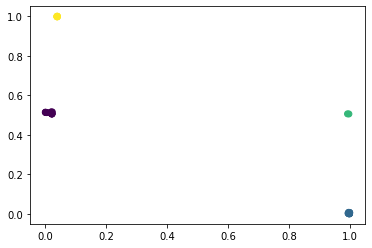

In [152]:
plt.scatter(slopes, heights, c=clustering.labels_)

In [131]:
from dbscan2 import dbscan2
import pandas as pd

In [141]:
np.array(list(zip(slopes, heights))).shape

(58, 2)

array([0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 2, 0, 1, 0, 1, 2, 1, 3, 0, 3,
       0, 0, 2, 2, 3, 1, 3, 3, 4, 1, 2, 0, 2, 0, 0, 1, 0, 1, 1, 1, 1, 0,
       3, 0, 1, 3, 4, 0, 0, 3, 1, 1, 1, 1, 1, 2])

In [157]:
def printLinesOnEdges(edges, lines):
	edges_lines = cv2.merge([edges, edges, edges])
	if lines is not None:
		for i in range(0, len(lines)):
			l = lines[i][0]
			cv2.line(edges_lines, (l[0], l[1]), (l[2], l[3]), (0,0,255), 3, cv2.LINE_AA)
	cv2.imwrite('./edges_lines.png', edges_lines)

In [53]:
import math
edges_lines = cv2.merge([edges, edges, edges])
if lines is not None:
	for i in range(0, len(lines)):
		rho = lines[i][0][0]
		theta = lines[i][0][1]
		a = math.cos(theta)
		b = math.sin(theta)
		x0 = a * rho
		y0 = b * rho
		pt1 = (int(x0 + 1000*(-b)), int(y0 + 1000*(a)))
		pt2 = (int(x0 - 1000*(-b)), int(y0 - 1000*(a)))
		cv2.line(edges_lines, pt1, pt2, (0,0,255), 3, cv2.LINE_AA)
cv2.imwrite('./edges_lines.png', edges_lines)

True

In [ ]:
import cv2
import math
import numpy as np
from common import image_utils
def remove_clouds(img, ksize=7, sigma=15):
    # new_dim = (int(img.shape[1] * 0.5), int(img.shape[0] * 0.5))
    # img = cv2.resize(img, new_dim, interpolation=cv2.INTER_AREA)
    # print(img.shape)

    template = image_utils.get_cloud_template()
    # new_dim = (int(template.shape[1] * 0.5), int(template.shape[0] * 0.5))
    # template = cv2.resize(template, new_dim, interpolation=cv2.INTER_AREA)
    hh, ww = template.shape[:2]
    print(template.shape)

    pawn = template[:, :, 0:3]
    alpha_template = template[:, :, 3]
    alpha = cv2.merge([alpha_template, alpha_template, alpha_template])

    result_set = []

    for scale in range(90, 110, 2):# np.linspace(0.4, 2, 50)[::-1]:
        scale = scale / 100.0
        new_dim = (int(img.shape[1] * scale), int(img.shape[0] * scale))
        resized = cv2.resize(img, new_dim, interpolation=cv2.INTER_AREA)
        if resized.shape[0] < template.shape[0] or resized.shape[1] < template.shape[1]:
            break

        img_alpha = np.ones((resized.shape[0:2]))
        
        corr_img = cv2.matchTemplate(resized, pawn, cv2.TM_CCOEFF_NORMED, mask=alpha)
        correlation_raw = (255 * corr_img).clip(0, 255).astype(np.uint8)

        blur = cv2.GaussianBlur(correlation_raw, (ksize, ksize), sigmaX=sigma)
        threshold = 100

        # cv2.imwrite('./cloud/blur_%.2f.png' % scale, blur)
        
        maximum = np.max(blur)
        
        result = img.copy()
        max_val = np.max(blur)
        rad = int(math.sqrt(hh * hh + ww * ww) / 4)

        count = 0
        
        while max_val > threshold:

            # find max value of correlation image
            min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(blur)

            if max_val > threshold:
                # draw match on copy of input
                # cv2.rectangle(result, max_loc, (max_loc[0]+ww, max_loc[1]+hh), (0, 0, 255), 2)
                img_alpha[max_loc[1]: max_loc[1]+hh, max_loc[0]: max_loc[0]+ww] = \
                    img_alpha[max_loc[1]: max_loc[1]+hh, max_loc[0]: max_loc[0]+ww] - alpha_template / 255.0

                # write black circle at max_loc in corr_img
                cv2.circle(blur, (max_loc), radius=rad, color=0, thickness=cv2.FILLED)
                count += 1
                
            else:
                break
        img_alpha_c = img_alpha.clip(0, 1).astype(np.uint8)
        mask = cv2.merge([img_alpha_c, img_alpha_c, img_alpha_c]).astype(np.uint8)
        # result = cv2.multiply(resized, mask)
        # cv2.imwrite('./cloud/alpha_%.2f.png' % scale, result)
        # cv2.imwrite('./cloud/blur_blocked_%.2f.png' % scale, blur)
        alpha_area = np.sum(img_alpha_c == 0) / (img_alpha_c.shape[0] * img_alpha_c.shape[1])
        # print("scale %.2f: %d, %.2f, %d, %.4f" % (scale, maximum, maximum / (scale), count, alpha_area))
        result_set.append([scale, maximum, maximum / scale, count, alpha_area, mask])
    selected_scaling = sorted(result_set, key=lambda x: -x[2])[0]
    print(selected_scaling[:5])
    resized_original = cv2.resize(selected_scaling[5], (img.shape[1], img.shape[0]), interpolation=cv2.INTER_AREA)
    # return resized_original

path = '/Users/jean/Documents/Coding/Polytopia/src/resources/ps11w4-winterstorms_plague-e99769/INPUT/1c3f544e-dc6c-4aff-b6cd-ac5408439269.png'
path = '/Users/jean/Documents/Coding/Polytopia/src/resources/ps11w4-winterstorms_plague-e99769/INPUT/2a0de14a-c3dc-4d6f-b1ee-b9a42be4725d.png'
files = ['1c3f544e-dc6c-4aff-b6cd-ac5408439269']
channel_name = 'ps11w4-winterstorms_plague-e99769'

img = cv2.imread(path)
without_cloud = remove_clouds(img)
print(img.shape, without_cloud.shape)


In [ ]:
def blob(scale, blur):
	# img_gray = cv2.imread('./cloud/blur_%.2f.png' % scale, cv2.IMREAD_GRAYSCALE)
	# keypoints = detector.detect(img_gray)
	# print(keypoints[0])
	# im_with_keypoints = cv2.drawKeypoints(img_gray, keypoints, np.array([]), (0, 0, 255), cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
	# blobs('./cloud/blur_%.2f.png' % scale)
	# cv2.imwrite('./cloud/blobs_%.2f.png' % scale, im_with_keypoints)
	thresh = cv2.threshold(blur, 20, 255, cv2.THRESH_BINARY)[1]
	cv2.imwrite('./cloud/thresh_%.2f.png' % scale, thresh)
	output = cv2.connectedComponentsWithStats(thresh, 4, cv2.CV_32S)
	(numLabels, labels, stats, centroids) = output
	sum_mask = np.zeros_like(thresh)

	for i in range(0, numLabels):
		mask = (labels == i).astype("uint8") * 255
		if np.sum(mask) > 2 and np.sum(mask) < 1000:
			sum_mask = (sum_mask + mask).clip(0, 255)
		
	cv2.imwrite('./cloud/blobs_%.2f.png' % (scale), sum_mask)

In [ ]:
import cv2
import numpy as np
  
# Read the main image
path = '/Users/jean/Documents/Coding/Polytopia/src/resources/ps11w4-winterstorms_plague-e99769/INPUT/1c3f544e-dc6c-4aff-b6cd-ac5408439269.png'
img_rgb = cv2.imread(path)
  
# Convert to grayscale
img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_BGR2GRAY)
  
# Read the template
template = cv2.imread('/Users/jean/Documents/Coding/Polytopia/src/templates/cloud_template.png',0)
  
# Store width and height of template in w and h
w, h = template.shape[::-1]
found = None
 
for scale in np.linspace(0.2, 1.0, 20)[::-1]:
 
    # resize the image according to the scale, and keep track
    # of the ratio of the resizing
    new_dim = (int(img_gray.shape[1] * scale), int(image.shape[0] * scale))
    resized = cv2.resize(img_gray, new_dim, interpolation=cv2.INTER_AREA)
    r = img_gray.shape[1] / float(resized.shape[1])
  
    # detect edges in the resized, grayscale image and apply template
    # matching to find the template in the image 
    edged = cv2.Canny(resized, 50, 200) 
    result = cv2.matchTemplate(edged, template, cv2.TM_CCOEFF)
    (_, maxVal, _, maxLoc) = cv2.minMaxLoc(result)
    # if we have found a new maximum correlation value, then update
    # the found variable if found is None or maxVal > found[0]:
    if resized.shape[0] < h or resized.shape[1] < w:
        break
    found = (maxVal, maxLoc, r)
  
# unpack the found variable and compute the (x, y) coordinates
# of the bounding box based on the resized ratio
(_, maxLoc, r) = found
(startX, startY) = (int(maxLoc[0] * r), int(maxLoc[1] * r))
(endX, endY) = (int((maxLoc[0] + tW) * r), int((maxLoc[1] + tH) * r))
 
# draw a bounding box around the detected result and display the image
cv2.rectangle(image, (startX, startY), (endX, endY), (0, 0, 255), 2)
cv2.imshow("Image", image)
cv2.waitKey(0)

In [ ]:
template.shape[::-1]

In [ ]:

import cv2

from score_recognition import score_recognition_utils

path = "/Users/jean/Documents/Coding/Polytopia/tests/resources/score_recognition/image_3.png"
path = "/Users/jean/Documents/Coding/Polytopia/Screenshot_20220210_233213_air.com.midjiwan.polytopia.jpg"
image = cv2.imread(path)

In [ ]:
text = score_recognition_utils.read_scores(image)

In [ ]:
text

In [ ]:
# img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
import numpy as np
hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
light = (256, 256, 256)
dark = (100, 0, 100)
#dark = (120, 0, 50)
#light = (230, 40, 150)

# light = (255, 255, 255)
# dark = (150, 150, 150)
light = (200, 256, 256)
dark = (0, 210, 200)

mask = cv2.inRange(hsv, dark, light)
print(np.min(mask), np.max(mask))
cv2.imwrite('./mask.png', mask)
result = cv2.bitwise_and(image, image, mask=mask)
cv2.imwrite('./colour.png', result)

In [ ]:
# invert = cv2.invert(image)
img_not = cv2.bitwise_not(image)
cv2.imwrite('./inverted.png', img_not)

In [ ]:
text = score_recognition_utils.get_scores(img_not, only_you=True)
print(text)

In [ ]:
text

In [ ]:
import pandas as pd
scores = pd.DataFrame([
[None, 0, 415],
['Player1', 0, 640],
[None, 0, 465],
[None, 0, 630],
[None, 1, 760],
['Npico', 1, 640],
['Player1', 1, 940],
[None, 1, 790],
[None, 2, 1515],
['Npico', 2, 1240],
['Nuupi', 2, 1530],
['Player1', 2, 2035]], columns=['polytopia_player_name', 'turn', 'score'])

In [ ]:
from score_recognition import score_visualisation
print(score_visualisation.print_scores(scores))

In [ ]:
print(score_visualisation.print_player_scores(scores, 'Player1'))

In [ ]:
from table2ascii import table2ascii as t2a, PresetStyle

print(list(scores.columns))
# In your command:
output = t2a(
    header=list(scores.columns), # ["Rank", "Team", "Kills", "Position Pts", "Total"],
    body=scores.to_numpy().tolist(), # [[1, 'Team A', 2, 4, 6], [2, 'Team B', 3, 3, 6], [3, 'Team C', 4, 2, 6]],
    style=PresetStyle.thin_compact
)
print(output)
# await ctx.send(f"```\n{output}\n```")

In [ ]:
scores.loc[scores["polytopia_player_name"].notna(), 'delta'] = scores[scores["polytopia_player_name"].notna()].groupby('polytopia_player_name').apply(lambda x: x['score'].astype(int).diff()).values
scores

In [ ]:
scores

In [5]:
str(([1, 2], [3, 4]))

'([1, 2], [3, 4])'

In [10]:
str(list((1, 2)))

'[1, 2]'

In [45]:
import cv2
import numpy as np
from common.image_utils import get_cloud_template
from common.image_processing_utils import get_one_color_edges

img = get_cloud_template()
frame = cv2.imread("/Users/jean/Documents/Coding/Polytopia/Screenshot_2022-02-04-17-31-07-301_air.com.midjiwan.polytopia.jpg")
img = get_one_color_edges(img)

sift = cv2.SIFT_create()
kp_image, desc_image = sift.detectAndCompute(img, None)
index_params = dict(algorithm = 0, trees = 5)
search_params = dict()
flann = cv2.FlannBasedMatcher(index_params, search_params)

# grayframe = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
grayframe = get_one_color_edges(frame)

kp_grayframe, desc_grayframe = sift.detectAndCompute(grayframe, None)

matches= flann.knnMatch(desc_image, desc_grayframe, k=2)

good_points=[]

for m, n in matches: 
     
    if(m.distance < 0.8 * n.distance): 
        good_points.append(m) 

query_pts = np.float32([kp_image[m.queryIdx] 
                .pt for m in good_points]).reshape(-1, 1, 2) 

train_pts = np.float32([kp_grayframe[m.trainIdx] 
                .pt for m in good_points]).reshape(-1, 1, 2) 
 
matrix, mask = cv2.findHomography(query_pts, train_pts, cv2.RHO, 10.0) 

matches_mask = mask.ravel().tolist() 
 
h,w = img.shape
 
pts = np.float32([[0,0],[0,h-1],[w-1,h-1],[w-1,0]]).reshape(-1,1,2)
 
dst = cv2.perspectiveTransform(pts, matrix)
 
homography = cv2.polylines(frame, [np.int32(dst)], True, (255, 0, 0), 3) 
 
# cv2.imshow("Homography", homography) 
cv2.imwrite('./homography.png', homography)

True

: 

In [42]:
image_keypoints = cv2.drawKeypoints(img, kp_image, 0, (0, 255, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
cv2.imwrite('./img_keypoints.png', image_keypoints)
frame_keypoints = cv2.drawKeypoints(grayframe, kp_grayframe, 0, (0, 255, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
cv2.imwrite('./frame_keypoints.png', frame_keypoints)

True

In [6]:
import cv2
import numpy as np
from common.image_utils import get_cloud_template
# img = cv2.imread("img.jpg", cv2.IMREAD_GRAYSCALE)
# cap = cv2.VideoCapture(0)
img = get_cloud_template()
frame = cv2.imread("/Users/jean/Documents/Coding/Polytopia/Screenshot_2022-02-04-17-31-07-301_air.com.midjiwan.polytopia.jpg")

In [8]:
sift = cv2.SIFT_create()
kp_image, desc_image = sift.detectAndCompute(img, None)
index_params = dict(algorithm = 0, trees = 5)
search_params = dict()
flann = cv2.FlannBasedMatcher(index_params, search_params)

In [17]:
# _, frame = cap.read()

grayframe = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

kp_grayframe, desc_grayframe = sift.detectAndCompute(grayframe, None)

matches= flann.knnMatch(desc_image, desc_grayframe, k=2)

good_points=[]

for m, n in matches: 
     
    if(m.distance < n.distance): 
        good_points.append(m) 

In [18]:
len(matches), len(good_points)

(18, 18)

In [19]:
query_pts = np.float32([kp_image[m.queryIdx] 
                .pt for m in good_points]).reshape(-1, 1, 2) 
 
train_pts = np.float32([kp_grayframe[m.trainIdx] 
                .pt for m in good_points]).reshape(-1, 1, 2) 
 
matrix, mask = cv2.findHomography(query_pts, train_pts, cv2.RANSAC, 5.0) 
 
matches_mask = mask.ravel().tolist() 
 
h,w,d = img.shape
 
pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
 
dst = cv2.perspectiveTransform(pts, matrix)
 
homography = cv2.polylines(frame, [np.int32(dst)], True, (255, 0, 0), 3) 
 
cv2.imshow("Homography", homography) 

2022-05-24 13:20:56.104 Python[72409:6919388] ApplePersistenceIgnoreState: Existing state will not be touched. New state will be written to /var/folders/ks/8tknm8f96kz76nccrfvhbd4w0000gn/T/org.python.python.savedState


In [20]:
cv2.imwrite('./homography.png', homography)

True

In [21]:
matches_mask

[0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1]

In [23]:
matrix

array([[-2.46375327e+00, -9.21941890e+00,  6.64855743e+02],
       [-1.73025503e+00, -4.89193604e+00,  3.99079150e+02],
       [-3.86111135e-03, -1.32721150e-02,  1.00000000e+00]])

In [25]:
len(query_pts), len(train_pts)

(18, 18)

In [26]:
pts

array([[[  0.,   0.]],

       [[  0.,  75.]],

       [[122.,  75.]],

       [[122.,   0.]]], dtype=float32)

In [64]:
import cv2
import numpy as np
from common.image_processing_utils import get_one_color_edges

def norm(a):
	return (a - np.min(a)) / (np.max(a) - np.min(a))

LIGHT_COLOUR = (0, 0, 0)
DARK_COLOUR = (10, 10, 10)

# template = cv2.imread("/Users/jean/Documents/Coding/Polytopia/src/cropped_template.jpg")
template = cv2.imread("/Users/jean/Documents/Coding/Polytopia/src/templates/background_template_324.png")
# template = cv2.imread("/Users/jean/Documents/Coding/Polytopia/Screenshot_2022-02-04-17-31-07-301_air.com.midjiwan.polytopia.jpg")

def match_template(template, withMask, ksize: int = 3, sigma: int = 5):
	if withMask:
		# mask = cv2.inRange(template[:, :, 0: 3], LIGHT_COLOUR, DARK_COLOUR)
		mask = 1-cv2.inRange(template, LIGHT_COLOUR, DARK_COLOUR)
	else:
		mask = None
	# else:
	# mask = np.zeros_like(template[:, :])

	shape = template.shape

	# frame2 = np.zeros((shape[0] * 3 - 2, shape[1] * 3 - 2, 3)).astype("uint8")
	# frame[shape[0] - 1: shape[0] * 2 - 1, shape[1] - 1: shape[1] * 2 - 1, :] = template
	frame = cv2.copyMakeBorder(template, shape[0] - 1, shape[0] - 1, shape[1] - 1, shape[1] - 1, cv2.BORDER_CONSTANT, 0)
	# cv2.imwrite("./frame_w_borders.png", frame)
	# print(frame.shape, frame2.shape)
	corr_img = cv2.matchTemplate(frame, template, cv2.TM_SQDIFF, mask=mask)
	# print(np.min(corr_img), np.max(corr_img))

	correlation_raw = (255 * (corr_img - np.min(corr_img)) / (np.max(corr_img) - np.min(corr_img))).astype(np.uint8)

	# correlation_raw = (255 * norm(corr_img)).clip(0, 255).astype(np.uint8)
	# print(shape, mask.shape, correlation_raw.shape)
	# threshold = cv2.threshold(correlation_raw, )
	# (_, thresh) = cv2.threshold(1-correlation_raw, 220, 255, cv2.THRESH_TRUNC)
	# thresh = cv2.adaptiveThreshold(correlation_raw,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY,21,0)

	print(np.min(mask), np.max(mask))
	return correlation_raw, mask

#blur = cv2.GaussianBlur(correlation_raw, (ksize, ksize), sigmaX=sigma)

edges = get_one_color_edges(template)
# small_template = cv2.resize(template, ())
cv2.imwrite("./self_edges.png", edges)
correlation_raw, mask = match_template(edges, withMask=False)

print(np.min(mask), np.max(mask))
cv2.imwrite("./self_matching.png", correlation_raw)
# cv2.imwrite("./self_matching_diff.png", 255 * (correlation_raw > blur).astype("uint8"))

None None
None None


True

In [189]:
import cv2
import numpy as np
from common.image_processing_utils import get_one_color_edges

def norm(a):
	return (a - np.min(a)) / (np.max(a) - np.min(a))

LIGHT_COLOUR = (0, 0, 0)
DARK_COLOUR = (10, 10, 10)

# template = cv2.imread("/Users/jean/Documents/Coding/Polytopia/src/cropped_template.jpg")
# template = cv2.imread("/Users/jean/Documents/Coding/Polytopia/src/templates/background_template_324.png")
# template = cv2.imread("/Users/jean/Documents/Coding/Polytopia/Screenshot_2022-02-04-17-31-07-301_air.com.midjiwan.polytopia.jpg")
template = cv2.imread("/Users/jean/Documents/Coding/Polytopia/src/Screenshot_20220125_143137_air.com.midjiwan.polytopia.jpg")

def match_template(template, edges, withMask):
	if withMask:
		background = 255-cv2.inRange(template, LIGHT_COLOUR, DARK_COLOUR)
		contours, _ = cv2.findContours(background, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
		selected_contour = sorted([(c, cv2.contourArea(c)) for c in contours], key=lambda x: -x[1])[0]
		mask = cv2.drawContours(np.zeros_like(background), [selected_contour[0]], -1, (255, 255, 255), thickness=cv2.FILLED)
	else:
		mask = None

	shape = template.shape

	masked_edges = cv2.bitwise_and(edges, edges, mask=mask)
	
	frame = cv2.copyMakeBorder(masked_edges, int(shape[0] / 2), int(shape[0] / 2) - 1, int(shape[1] / 2), int(shape[1] / 2) - 1, cv2.BORDER_CONSTANT, 0)
	
	corr_img = cv2.matchTemplate(frame, masked_edges, cv2.TM_CCOEFF, mask=mask)

	correlation_raw = (255 * (corr_img - np.min(corr_img)) / (np.max(corr_img) - np.min(corr_img))).astype(np.uint8)

	masked_correlation_raw = cv2.bitwise_and(correlation_raw, correlation_raw, mask=mask)

	(_, thresh) = cv2.threshold(masked_correlation_raw, 30, 255, cv2.THRESH_BINARY)

	return masked_correlation_raw, mask, thresh

edges = get_one_color_edges(template)
# template_edge = get_one_color_edges(template)
cv2.imwrite("./self_edges.png", edges)

correlation_raw, mask, thresh = match_template(template, edges, withMask=True)

cv2.imwrite("./self_matching.png", correlation_raw)
cv2.imwrite("./self_mask.png", mask)
print(np.min(mask), np.max(mask))

cv2.imwrite("./self_masked_matching.png", thresh)

contours, _ = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
centers = [np.reshape(np.mean(c, axis=0).astype(np.int32), (1, 1, 2)) for c in contours]

contour_mask = cv2.drawContours(np.zeros((1080, 2312, 3)), centers, -1, (255, 255, 255))
cv2.imwrite("./self_contour.png", contour_mask)

0 1


True

In [251]:

# thresh_contour = cv2.cvtColor(thresh, cv2.COLOR_GRAY2RGB) # .astype(np.float32)
contours, _ = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
centers = [np.reshape(np.mean(c, axis=0).astype(np.int32), (1, 1, 2)) for c in contours]
contour_mask = cv2.drawContours(np.zeros((1080, 2312, 3)), centers, -1, (255, 255, 255))
cv2.imwrite("./self_contour.png", contour_mask)

True

In [301]:
type(centers[0])

numpy.ndarray

In [269]:
import pandas as pd


In [298]:
import matplotlib.pyplot as plt
def get_interpoint_space(centers):
	center_pd = pd.DataFrame(np.reshape(centers, (len(centers), 2)), columns=['x', 'y'])
	grouped_centers = center_pd.groupby(by="x").agg(list)
	values = [c[i] - c[i + 1] for i, c in grouped_centers["y"].iteritems() for i in range(len(c) - 1)]
	# plt.hist(values, bins=int((np.max(values) - np.min(values))/5))
	num, bins = np.histogram(values, bins=int((np.max(values) - np.min(values))/5) + 1)
	max_index = np.argmax(num)
	min_bin = bins[max_index]
	max_bin = bins[max_index + 1]

	return int(np.median([v for v in values if min_bin <= v <= max_bin]))

57

In [273]:
type(grouped_centers["y"].array)

pandas.core.arrays.numpy_.PandasArray

In [99]:
mask = 255-cv2.inRange(template[:, :, 0: 3], LIGHT_COLOUR, DARK_COLOUR)
cv2.imwrite("./self_mask.png", mask)
np.min(mask), np.max(mask)

(0, 255)

In [101]:
shape = edges.shape
mask_border = cv2.copyMakeBorder(mask, int(shape[0] / 2), int(shape[0] / 2) - 1, int(shape[1] / 2), int(shape[1] / 2) - 1, cv2.BORDER_CONSTANT, 0)
cv2.imwrite("./self_mask_border.png", mask_border)

True

In [139]:
def norm(a):
	return (a - np.min(a)) / (np.max(a) - np.min(a))

masked_corr = cv2.bitwise_and(255 - correlation_raw, 255 - correlation_raw,mask = mask)
cv2.imwrite("./masked_corr.png", masked_corr)

True

In [149]:
second_pass, mask3 = match_template(masked_corr, masked_corr, False)
cv2.imwrite("./second_pass.png", 255-second_pass)

14.0 596235300.0


True

In [142]:
(_, thresh) = cv2.threshold(masked_corr, 60, 255, cv2.THRESH_BINARY)
cv2.imwrite("./masked_corr_thresh.png", thresh)

True

In [106]:
np.min(masked_corr), np.max(masked_corr)

(0, 255)

In [115]:
correlation_raw.shape, edges.shape, mask_border.shape, mask.shape

((1500, 2282), (1500, 2282), (2999, 4563), (1500, 2282))

In [45]:
template.shape

(1500, 2282, 3)

In [91]:
np.min(mask_border), np.max(mask_border)

(0, 2)

In [63]:
second_pass, _ = match_template(correlation_raw, withMask=False)

In [182]:
np.min(correlation_raw), np.max(correlation_raw)

(0, 255)

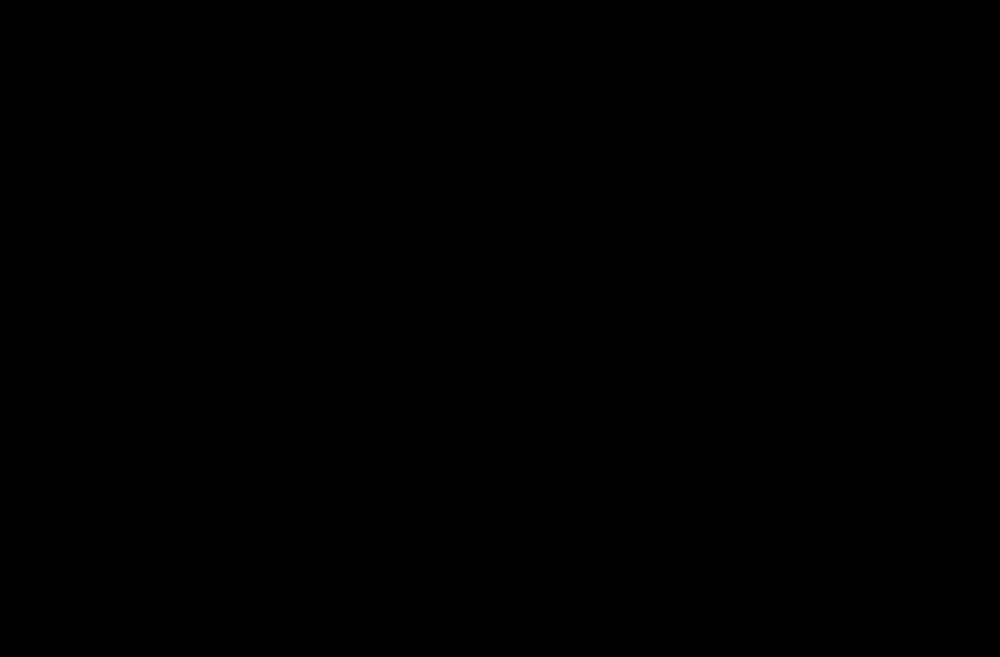

In [43]:
from PIL import Image
from IPython.display import display, clear_output

# convert color from CV2 BGR back to RGB
image = cv2.cvtColor(correlation_raw, cv2.COLOR_BGR2RGB)
display(Image.fromarray(image))

In [ ]:
image = cv2.cvtColor(correlation_raw, cv2.COLOR_BGR2RGB)
display(Image.fromarray(image))

In [ ]:
correlation_raw

In [44]:
np.max(mask)

1

In [41]:
result = np.zeros_like(blur)
for i in range(1, blur.shape[0] - 1):
	for j in range(1, blur.shape[1] - 1):
		if np.max(blur[i-1:i+1, j-1:j+1]) == blur[i, j]:
			result[i, j] = 255
cv2.imwrite("./local_max.png", result)

True

In [19]:
correlation_raw.shape
frame.dtype, template.dtype
blur.shape, correlation_raw.shape

((4679, 2159), (4679, 2159))

In [38]:
im = correlation_raw.copy()

maxima = cv2.dilate(im, None, iterations=20)
med = cv2.medianBlur(im, ksize=19)

maxmask = (im == maxima)
medmask = (im.astype(np.int16) >= med.astype(np.int16) + 20) # peak property. avoiding unsigned difference.

mask = maxmask & medmask

canvas = cv2.cvtColor(im, cv2.COLOR_GRAY2BGR)
#mask = cv.dilate(mask.astype(np.uint8), None, iterations=3) # purely for display

y,x = np.nonzero(mask)
canvas[y,x] = (0,0,255)

cv2.imwrite("./canvas.png", canvas)

True

In [39]:
im.shape

(2971, 2159)

In [37]:
img = correlation_raw
im = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)

# apply thresholding
ret, im2 = cv2.threshold(img, 150, 255, cv2.THRESH_BINARY)
# dilate the thresholded peaks to eliminate "pinholes"
im3 = cv2.dilate(im2, None, iterations=2)

contours, hier = cv2.findContours(im3, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
print('found', len(contours), 'contours')
# draw a bounding box around each contour
for contour in contours:
    x,y,w,h = cv2.boundingRect(contour)
    cv2.rectangle(im, (x,y), (x+w,y+h), (255,0,0), 2)

cv2.imwrite("./canvas_2.png", im)

found 1 contours


True

In [74]:
import os
import cv2
import math

import numpy as np

from typing import List
from typing import Tuple
from typing import Optional
from sklearn.cluster import DBSCAN

from common import image_utils
from common import image_processing_utils
from common.image_operation import ImageOp
from map_patching.image_param import ImageParam
from map_patching.corner_orientation import CornerOrientation
from database_interaction.database_client import DatabaseClient

DEBUG = int(os.getenv("POLYTOPIA_DEBUG", 0))

def get_cloud_alpha(
        map_image: np.ndarray,
        ksize: int = 7,
        sigma: int = 15,
        is_background: bool = False) -> Tuple[np.ndarray, float]:

    template = image_utils.get_cloud_template()

    # print("alpha hist", np.histogram(alpha_template, bins=[-4, -3, -2, -1, 0, 1]))

    result_set = []

    # TODO Optimisation possibilities:
    # - not go linear, look for the point
    # - start in the middle and go out, based on gradient
    # - stop when it goes down again
    # - change spacing
    # - move range based on estiamted scaling
    # - add half-templates
    for int_scale in range(40, 400, 20):
        scale = int_scale / 100.0
        # new_dim = (int(map_image.shape[1] * scale), int(map_image.shape[0] * scale))
        new_dim = (int(template.shape[1] / scale), int(template.shape[0] / scale))
        resized_template = cv2.resize(template[:, :, 0:3], new_dim, interpolation=cv2.INTER_AREA)
        if map_image.shape[0] < resized_template.shape[0] or map_image.shape[1] < resized_template.shape[1]:
            break

        hh, ww = resized_template.shape[:2]
        img_alpha = np.ones((map_image.shape[0:2]))

        alpha_template = cv2.resize(template[:, :, 3], new_dim, interpolation=cv2.INTER_AREA)
        alpha = cv2.merge([alpha_template, alpha_template, alpha_template])

        corr_img = cv2.matchTemplate(map_image, resized_template, cv2.TM_CCOEFF_NORMED, mask=alpha)
        correlation_raw = (255 * corr_img).clip(0, 255).astype(np.uint8)

        blur = cv2.GaussianBlur(correlation_raw, (ksize, ksize), sigmaX=sigma)
        threshold = 100

        maximum = np.max(blur)

        max_val = np.max(blur)
        rad = int(math.sqrt(hh * hh + ww * ww) / 4)

        count = 0

        while max_val > threshold:

            # find max value of correlation image
            min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(blur)

            if max_val > threshold:
                # draw match on copy of input
                img_alpha[max_loc[1]: max_loc[1] + hh, max_loc[0]: max_loc[0] + ww] = \
                    img_alpha[max_loc[1]: max_loc[1] + hh, max_loc[0]: max_loc[0] + ww] - alpha_template / 255.0

                # write black circle at max_loc in corr_img
                cv2.circle(blur, (max_loc), radius=rad, color=0, thickness=cv2.FILLED)
                count += 1

            else:
                break
        # cv2.imwrite("./alpha_before.png", (img_alpha * 255 / np.max(img_alpha)).astype("uint8"))
        hist = np.histogram(img_alpha, bins=[-4, -3, -2, -1, 0, 1])

        img_alpha_c = img_alpha.clip(0, 1).astype(np.uint8) * 255
        # mask = cv2.merge([img_alpha_c, img_alpha_c, img_alpha_c]).astype(np.uint8)
        alpha_area = np.sum(img_alpha_c == 0) / (img_alpha_c.shape[0] * img_alpha_c.shape[1])
        print("hist", scale, maximum, int(maximum / scale), count, "%.2f" % alpha_area, int(sum(hist[0][:-1])))
        #int(sum(hist[0][:-1])), int(np.dot(hist[0][:-1], hist[1][1:-1] - 1) / scale), hist)
        result_set.append([scale, maximum, maximum / scale, count, alpha_area, img_alpha_c])
        # v2.imwrite("./cloud_matching/%.2f.png" % scale, img_alpha_c)

    if False:  # not is_background:
        selected_scaling = sorted(result_set, key=lambda x: abs(1.21 - x[0]))[0]
    else:
        selected_scaling = sorted(result_set, key=lambda x: -x[3])[0]

    print("selected_scaling", selected_scaling[:5])
    resized_original = cv2.resize(
        selected_scaling[5], (map_image.shape[1], map_image.shape[0]), interpolation=cv2.INTER_AREA)
    return resized_original, selected_scaling[0]

map_image = cv2.imread("/Users/jean/Documents/Coding/Polytopia/src/cropped_template.jpg")
cloud_alpha, scale = get_cloud_alpha(map_image)
cv2.imwrite("./cloud_alpha.png", cloud_alpha)

hist 0.4 23 57 0 0.00 0
hist 0.6 30 50 0 0.00 0
hist 0.8 46 57 0 0.00 0
hist 1.0 28 28 0 0.00 0
hist 1.2 47 39 0 0.00 0
hist 1.4 250 178 8 0.09 28283
hist 1.6 255 159 25 0.17 104742
hist 1.8 62 34 0 0.00 0
hist 2.0 69 34 0 0.00 0
hist 2.2 140 63 2 0.01 0
hist 2.4 87 36 0 0.00 0
hist 2.6 250 96 15 0.05 6036
hist 2.8 255 91 65 0.16 83681
hist 3.0 161 53 132 0.36 46319
hist 3.2 115 35 113 0.29 0
hist 3.4 108 31 18 0.04 0
hist 3.6 255 70 88 0.12 82251
hist 3.8 91 23 0 0.00 0
selected_scaling [3.0, 161, 53.666666666666664, 132, 0.35890222321918147]


True

In [58]:
cloud_alpha.shape

AttributeError: 'tuple' object has no attribute 'shape'